# UC San Diego: Neural Data Science
## Final Project Title (change this to your project's title)

## Permissions

Place an `X` in the appropriate bracket below to specify if you would like your group's project to be made available to the public. (Note that student names will be included (but PIDs will be scraped from any groups who include their PIDs).

* [  ] YES - make available
* [  ] NO - keep private

# Names

- Rodrigo Lizaran-Molina
- Antara Sengupta
- Kyle Vu
- Austin Calza

# Overview

* Write a clear, 3-4 sentence summary of what you did and why.

<a id='research_question'></a>
# Research Question

* One sentence that describes the question you address in your project. Make sure what you’re measuring (variables) to answer your question is clear!


<a id='background'></a>

## Background & Prior Work

* In 2-3 paragraphs, describe the motivation behind your question. What’s the big picture, and why is it interesting? Are there published papers addressing aspects of your question? You should cite at least three primary references here. You are welcome to replicate published papers using publicly available data, just cite them and explain why!

References (include links):
- 1)
- 2)

# Hypothesis


*Fill in your hypotheses here*

# Dataset(s)

*Fill in your dataset information here*

(Copy this information for each dataset)
- Dataset Name:
- Link to the dataset:
- Number of observations:

1-2 sentences describing each dataset. 

If you plan to use multiple datasets, add 1-2 sentences about how you plan to combine these datasets.

# Data Analysis

In [1]:
# import libraries and dependencies

import os, requests
import numpy as np
import matplotlib.pyplot as plt
from skimage.util import montage
from sklearn.decomposition import PCA
import matplotlib.patheffects as path_effects
import tensorflow as tf
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Input, Dense, Flatten, Dropout, Reshape
from tensorflow.keras.optimizers import Adam
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import warnings

warnings.filterwarnings("ignore")
%config InlineBackend.figure_format = 'retina'


c:\Users\Rodrigo\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


### Data Collection and Wrangling

In [2]:
# Download data
fnames = ["kay_labels.npy", "kay_labels_val.npy", "kay_images.npz"]
urls = ["https://osf.io/r638s/download",
        "https://osf.io/yqb3e/download",
        "https://osf.io/ymnjv/download"]

for fname, url in zip(fnames, urls):
  if not os.path.isfile(fname):
    try:
      r = requests.get(url)
    except requests.ConnectionError:
      print("!!! Failed to download data !!!")
    else:
      if r.status_code != requests.codes.ok:
        print("!!! Failed to download data !!!")
      else:
        print(f"Downloading {fname}...")
        with open(fname, "wb") as fid:
          fid.write(r.content)
        print(f"Download {fname} completed!")

In [3]:
with np.load(fname) as dobj:
  dat = dict(**dobj)
labels = np.load('kay_labels.npy')
val_labels = np.load('kay_labels_val.npy')


print(f'Stimuli shape: {dat["stimuli"].shape}')
print(f'Response shape: {dat["responses"].shape}')
print(f'Labels shape: {labels.shape}')

Stimuli shape: (1750, 128, 128)
Response shape: (1750, 8428)
Labels shape: (4, 1750)



`labels` is a 4 by stim array of class names:  
- row 3 has the labels predicted by a deep neural network (DNN) trained on Imagenet
- rows 0-2 correspond to different levels of the wordnet hierarchy for the DNN predictions

In [4]:
labels[:3,:]

array([['artifact', 'entity', 'animal', ..., 'artifact', 'artifact',
        'artifact'],
       ['instrumentality', 'round shape', 'vertebrate', ..., 'structure',
        'structure', 'instrumentality'],
       ['equipment', 'sphere', 'mammal', ..., 'building', 'landing',
        'conveyance']], dtype='<U71')

In [5]:
print(labels[:, :4])
print(dat.keys())

[['artifact' 'entity' 'animal' 'animal']
 ['instrumentality' 'round shape' 'vertebrate' 'vertebrate']
 ['equipment' 'sphere' 'mammal' 'amphibian']
 ['croquet ball' 'bubble' 'komondor' 'tailed frog']]
dict_keys(['stimuli', 'stimuli_test', 'responses', 'responses_test', 'roi', 'roi_names'])


`dat` has the following fields:  
- `stimuli`: stim x i x j array of grayscale stimulus images
- `stimuli_test`: stim x i x j array of grayscale stimulus images in the test set  
- `responses`: stim x voxel array of z-scored BOLD response amplitude
- `responses_test`:  stim x voxel array of z-scored BOLD response amplitude in the test set  
- `roi`: array of voxel labels
- `roi_names`: array of names corresponding to voxel labels

This is the number of voxels in each ROI. Note that `"Other"` voxels have been removed from this version of the dataset:

We are going to use the stimuli, responses and roi

# Data Visualization

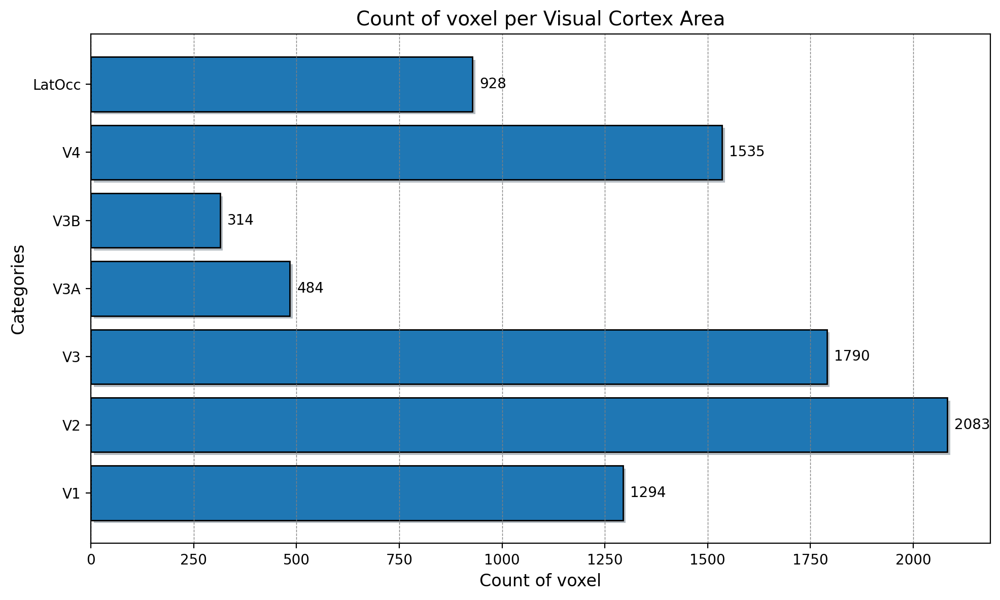

In [6]:
roi_counts = dict(zip(dat["roi_names"], np.bincount(dat["roi"])))

values = list(roi_counts.values())[1:]
names = list(roi_counts.keys())[1:]

# Create a horizontal bar plot
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.barh(names, values, edgecolor='black')

# Add grid lines
ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', axis='x')

# Add value annotations to each bar
for bar in bars:
    width = bar.get_width()
    ax.annotate(f'{width}', xy=(width, bar.get_y() + bar.get_height() / 2),
                xytext=(5, 0), textcoords="offset points",
                ha='left', va='center', fontsize=10, color='black')

# Customize title and labels
plt.xlabel('Count of voxel', fontsize=12)
plt.ylabel('Categories', fontsize=12)
plt.title('Count of voxel per Visual Cortex Area', fontsize=14)

# Customize ticks
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Add shadow effect to the bars
for bar in bars:
    bar.set_path_effects([plt.matplotlib.patheffects.withSimplePatchShadow()])

# Adjust the layout and spacing
plt.tight_layout()

# Show the plot
plt.show()

Each stimulus is a 128 x 128 grayscale array with 1750 total of images

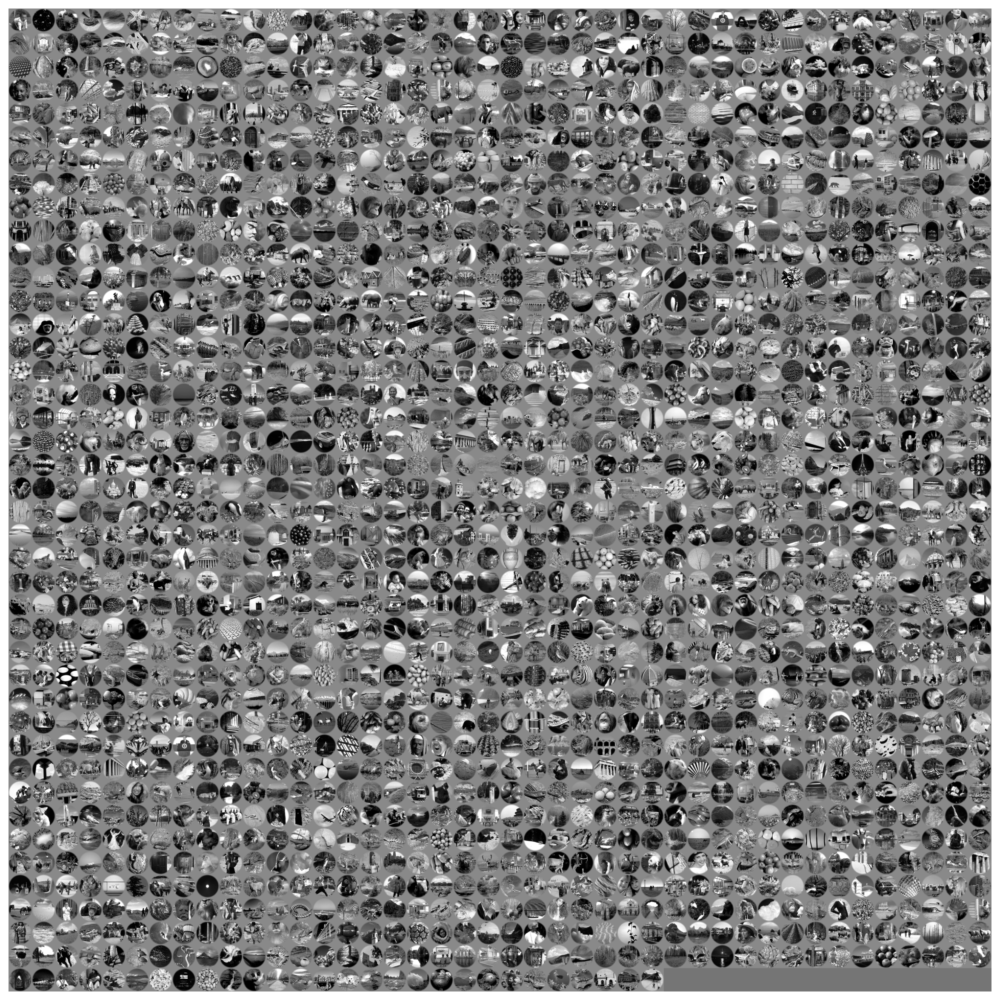

In [7]:
out = montage(dat['stimuli'])
f, ax = plt.subplots(figsize = (15,15))
plt.imshow(out, cmap = 'gray'); plt.axis('off');

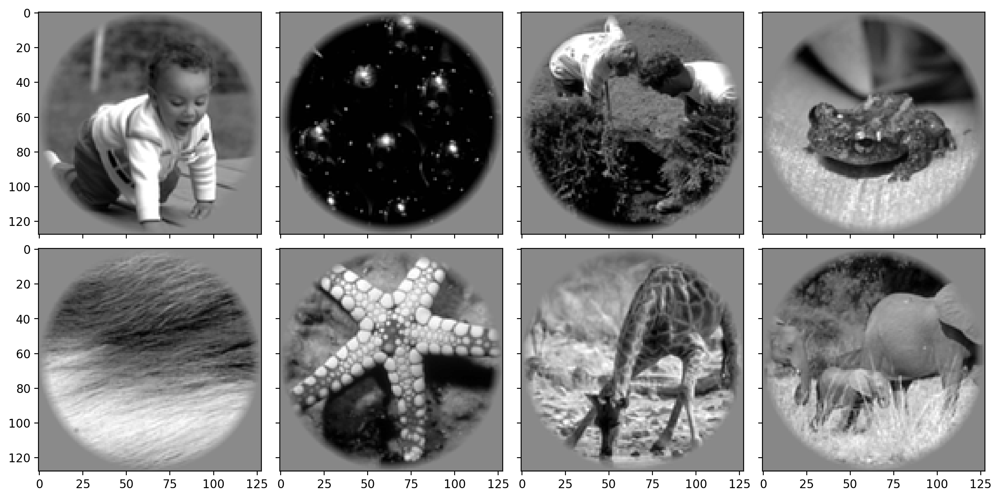

In [8]:
fig, axs = plt.subplots(2, 4, figsize=(12, 6), sharex=True, sharey=True)
for ax, im in zip(axs.flat, dat["stimuli"]):
  ax.imshow(im, cmap="gray")
fig.tight_layout()
fig.show()

Each stimulus is associated with a pattern of BOLD response across voxels in visual cortex:

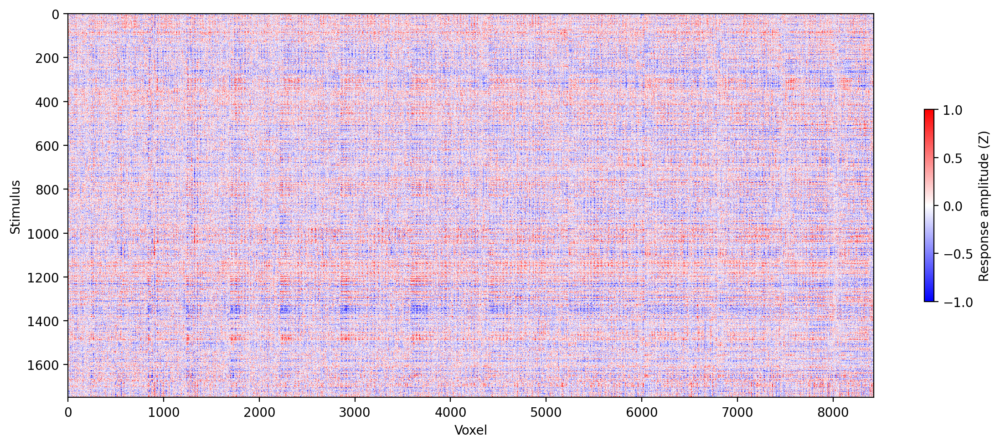

In [9]:
fig, ax = plt.subplots(figsize=(12, 5))
ax.set(xlabel="Voxel", ylabel="Stimulus")
heatmap = ax.imshow(dat["responses"],
                    aspect="auto", vmin=-1, vmax=1, cmap="bwr")
fig.colorbar(heatmap, shrink=.5, label="Response amplitude (Z)")
fig.tight_layout()
fig.show()

Each horizontal line represents the voxel/response from the brain for each stimuli. As you can see, there are strips of similar responses indicating similar stimulis have similiar brain responses.

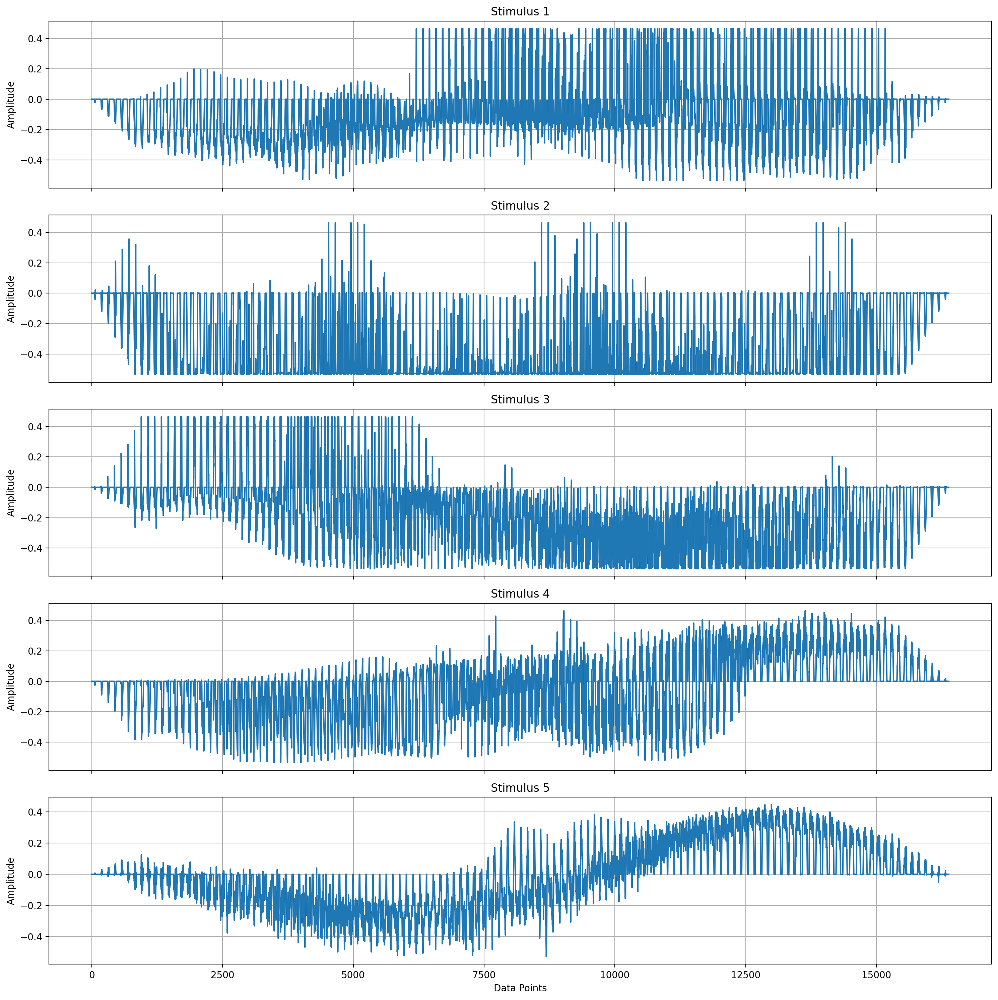

In [10]:
# Create 10 subplots for the first 10 stimuli in the data array
fig, axes = plt.subplots(5, 1, figsize=(15, 15), sharex=True)

# Flatting the data of stimilis
flat_dat = np.reshape(dat['stimuli'], (dat['stimuli'].shape[0],-1))

for i in range(5):
    axes[i].plot(flat_dat[i])
    axes[i].set_title(f'Stimulus {i+1}')
    axes[i].set_ylabel('Amplitude')
    axes[i].grid(True)

plt.xlabel('Data Points')
plt.tight_layout()
plt.show()

Visual representation of the first five stimuli (images) in a flattened version of their pixel representations. Each graph depicts the pixel intensity values for one of the images, showcasing the variations in pixel intensity across the entire image.

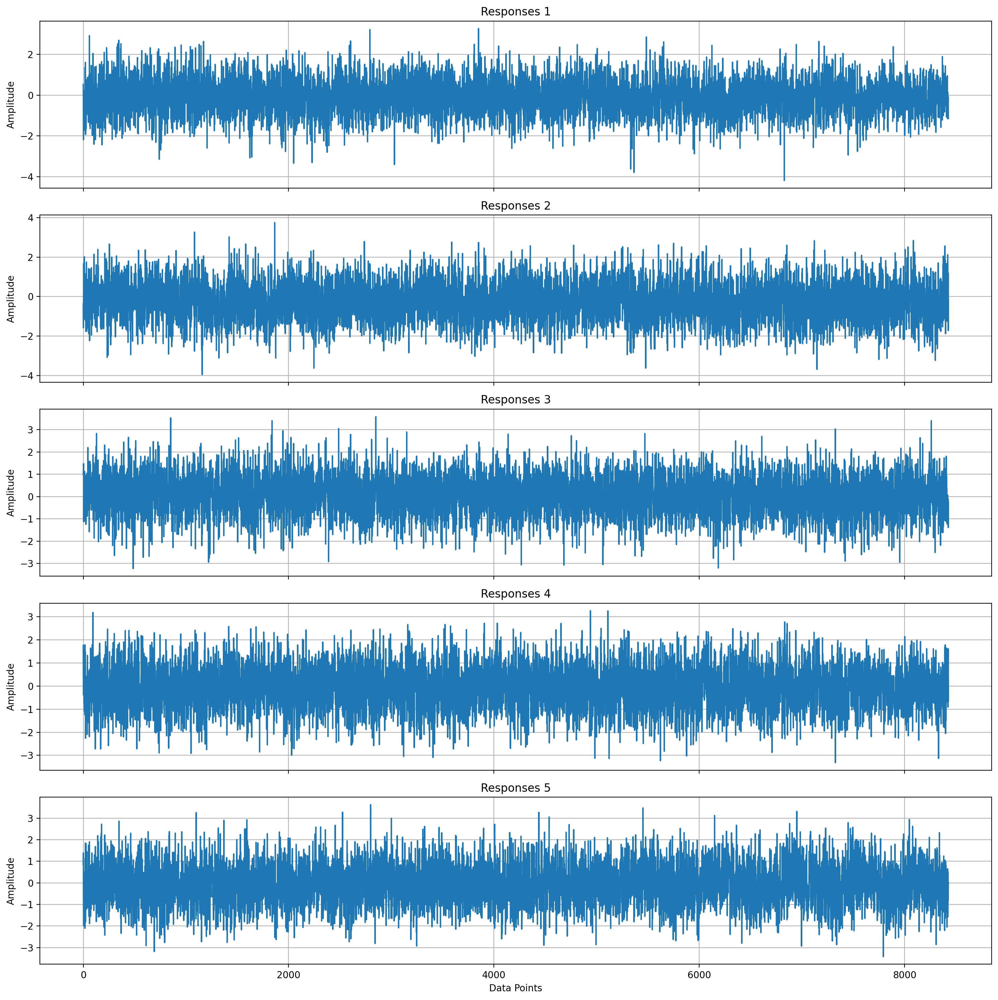

In [11]:
# Create 10 subplots for the first 10 stimuli in the data array
fig, axes = plt.subplots(5, 1, figsize=(15, 15), sharex=True)

for i in range(5):
    axes[i].plot(dat['responses'][i])
    axes[i].set_title(f'Responses {i+1}')
    axes[i].set_ylabel('Amplitude')
    axes[i].grid(True)

plt.xlabel('Data Points')
plt.tight_layout()
plt.show()

Visual representation of the brain activity in response to the first five stimuli (images). Each graph depicts the neural response patterns corresponding to one of the images, highlighting the variations in brain activity across different regions.

# Data Analysis & Results

In [12]:
# Load your data
responses = dat['responses']
stimuli = dat['stimuli']
stimuli = stimuli/255.0 # normalize

# Preprocess the brain wave responses
scaler = StandardScaler()
brain_wave_responses_scaled = scaler.fit_transform(dat['responses'])
pca = PCA(n_components=95, random_state=42)
brain_wave_responses_reduced = pca.fit_transform(brain_wave_responses_scaled)

In [13]:
# Define the autoencoder architecture
input_img = Input(shape=(128, 128, 1))
x = Flatten()(input_img)
encoded = Dense(128, activation='relu')(x)
decoded = Dense(128 * 128, activation='sigmoid')(encoded)
decoded = Reshape((128, 128, 1))(decoded)

# Create the autoencoder model
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy')

In [14]:
# Reshape stimuli for training the autoencoder
stimuli_reshaped = stimuli.reshape(-1, 128, 128, 1)
autoencoder.fit(stimuli_reshaped, stimuli_reshaped, epochs=13, batch_size=32, validation_split=0.2)

Epoch 1/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.6841 - val_loss: 0.5651
Epoch 2/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.4502 - val_loss: 0.1838
Epoch 3/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1700 - val_loss: 0.1168
Epoch 4/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1084 - val_loss: 0.0928
Epoch 5/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1015 - val_loss: 0.0778
Epoch 6/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0770 - val_loss: 0.0651
Epoch 7/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0602 - val_loss: 0.0520
Epoch 8/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0465 - val_loss: 0.0391
Epoch 9/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0344 - val_loss: 0.0276
Epoch 10/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0228 - val_loss: 0.0182
Epoch 11/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0148 - val_loss: 0.0107
Epoch 12/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0

In [15]:
# Create an encoder model to get the encoded representations
encoder = Model(input_img, encoded)

# Get the encoded representations
encoded_stimuli = encoder.predict(stimuli_reshaped)

# Elbow Method
inertias = []
silhouette_scores = []
K = range(5, 900, 20)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(encoded_stimuli)
    inertias.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(encoded_stimuli, kmeans.labels_))

55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


  File "c:\Users\Rodrigo\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 199, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "c:\Users\Rodrigo\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Rodrigo\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "c:\Users\Rodrigo\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


Text(0.5, 1.0, 'Silhouette Score For Optimal k')

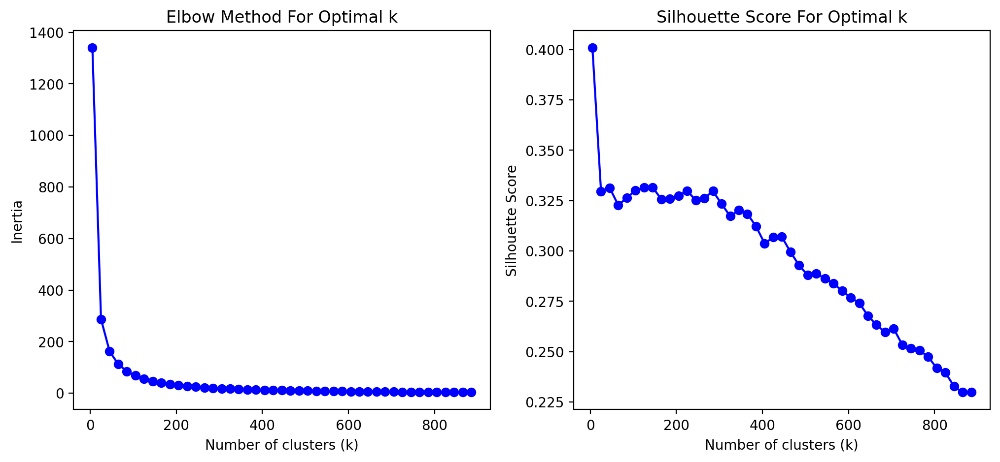

In [16]:
# Plotting Elbow Method
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(K, inertias, 'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k')

# Plotting Silhouette Score
plt.subplot(1, 2, 2)
plt.plot(K, silhouette_scores, 'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score For Optimal k')

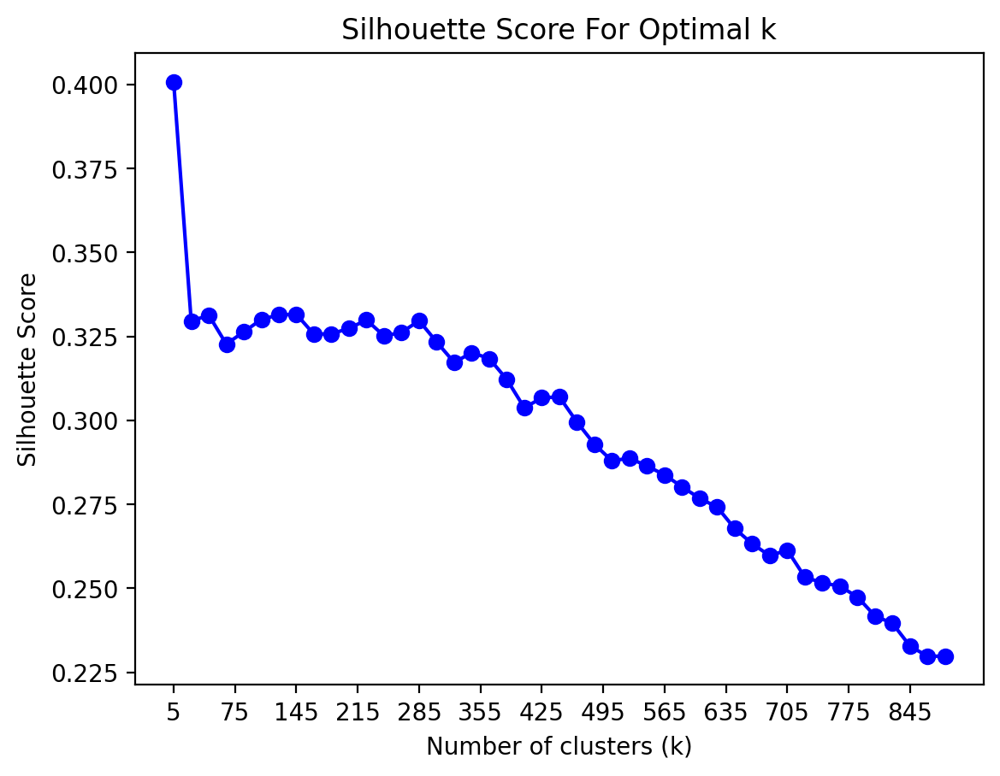

In [17]:
# Plotting Silhouette Score
plt.plot(K, silhouette_scores, 'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score For Optimal k')

# Reduce the number of x ticks
plt.xticks(np.arange(min(K), max(K)+1, 70))  # Adjust the step size as needed

plt.show()

1. Elbow Method
If the elbow graph has no clear elbow, it may be difficult to use this method alone to determine the optimal number of clusters.

2. Silhouette Method
If the silhouette graph has several peaks at [20, 75, 98, 158, 215, 285, 400, 565] , it suggests that there might be many distinct clustering solutions to consider. The peak values indicate the quality of the clustering at those points, with higher silhouette values indicating better-defined clusters.

Clusters: 20, Training Accuracy: 0.4580, Validation Accuracy: 0.1036
Clusters: 75, Training Accuracy: 0.4384, Validation Accuracy: 0.0286
Clusters: 98, Training Accuracy: 0.4777, Validation Accuracy: 0.0143
Clusters: 158, Training Accuracy: 0.5527, Validation Accuracy: 0.0143
Clusters: 215, Training Accuracy: 0.6098, Validation Accuracy: 0.0107
Clusters: 285, Training Accuracy: 0.6893, Validation Accuracy: 0.0000
Clusters: 400, Training Accuracy: 0.7679, Validation Accuracy: 0.0000
Clusters: 565, Training Accuracy: 0.8429, Validation Accuracy: 0.0000


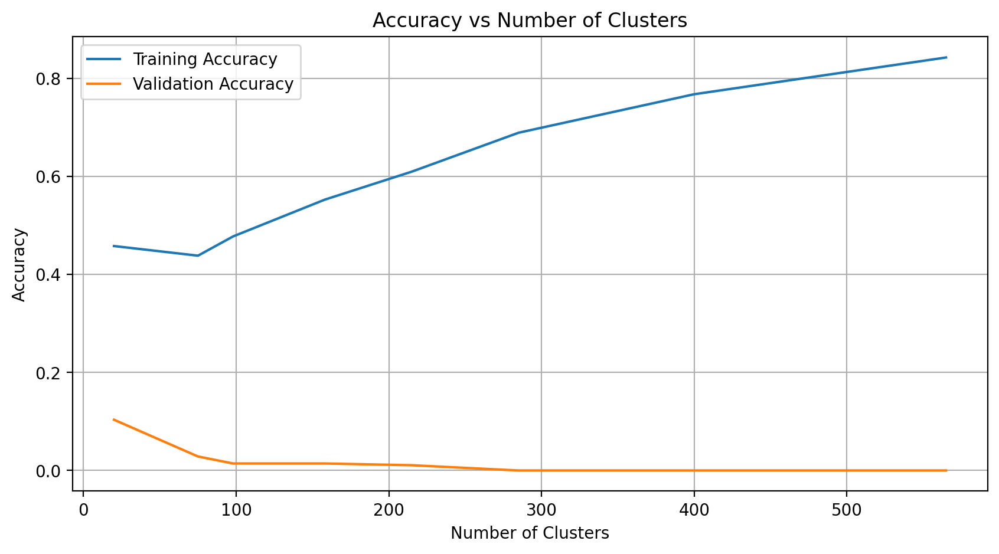

In [21]:
# Define the range of clusters to test
cluster_range = [20, 75, 98, 158, 215, 285, 400, 565]  # Example cluster numbers to test

# Initialize lists to store results
train_accuracies = []
val_accuracies = []

best_accuracy = 0
best_n_clusters = None

# Loop through each cluster number to find the best one
for n_clusters in cluster_range:
    # Perform k-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(encoded_stimuli)

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(brain_wave_responses_reduced, cluster_labels, test_size=0.2, random_state=42, shuffle=True)

    # Define a simple neural network for classification
    classifier = Sequential([
        Dense(95, input_shape=(95,), activation='relu'),
        Dropout(0.5),
        Dense(n_clusters, activation='softmax')
    ])

    # Compile the model
    classifier.compile(optimizer=Adam(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    # Train the classifier
    history = classifier.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=0)

    # Store the training and validation accuracies
    train_acc = history.history['accuracy'][-1]
    val_acc = history.history['val_accuracy'][-1]
    train_accuracies.append(train_acc)
    val_accuracies.append(val_acc)

    print(f"Clusters: {n_clusters}, Training Accuracy: {train_acc:.4f}, Validation Accuracy: {val_acc:.4f}")

    # Update the best cluster configuration
    if train_acc > best_accuracy:
        best_accuracy = train_acc
        best_n_clusters = n_clusters

# Plot the accuracies for different cluster numbers
plt.figure(figsize=(10, 5))
plt.plot(cluster_range, train_accuracies, label='Training Accuracy')
plt.plot(cluster_range, val_accuracies, label='Validation Accuracy')
plt.xlabel('Number of Clusters')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Number of Clusters')
plt.legend()
plt.grid(True)
plt.show()

This graph depicts the training accuracy and validation accuracy on the different number of clusters. As we can see, the more cluster used on our model the better accuracy we get but at the cost of the validation accuracy

In [30]:
# Re-train the model using the best number of clusters
print(f"Best number of clusters: {best_n_clusters} with accuracy: {best_accuracy:.4f}")

# Perform k-means clustering with the best number of clusters
kmeans = KMeans(n_clusters=best_n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(encoded_stimuli)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(brain_wave_responses_reduced, cluster_labels, test_size=0.2, random_state=42, shuffle=True)

# Define the neural network for the best cluster configuration
best_classifier = Sequential([
    Dense(95, input_shape=(95,), activation='relu'),
    Dropout(0.5),
    Dense(best_n_clusters, activation='softmax')
])

# Compile the model
best_classifier.compile(optimizer=Adam(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the classifier on the best configuration
best_classifier.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Evaluate the model on the test set
test_loss, test_accuracy = best_classifier.evaluate(X_test, y_test)
print(f"Test Accuracy with {best_n_clusters} clusters: {test_accuracy:.4f}")

Best number of clusters: 565 with accuracy: 0.8429
Epoch 1/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.0010 - loss: 10.6686 - val_accuracy: 0.0000e+00 - val_loss: 8.2845
Epoch 2/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0034 - loss: 9.0820 - val_accuracy: 0.0000e+00 - val_loss: 8.2811
Epoch 3/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0182 - loss: 7.6460 - val_accuracy: 0.0000e+00 - val_loss: 8.2763
Epoch 4/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0348 - loss: 6.7005 - val_accuracy: 0.0000e+00 - val_loss: 8.3582
Epoch 5/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0578 - loss: 5.7163 - val_accuracy: 0.0036 - val_loss: 8.4167
Epoch 6/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1022 - loss: 5.0253 - val_accuracy: 0.0000e+00 - val_loss: 8.5284
Epoch 7/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1457 - loss: 4.3456 - val_accuracy: 0.0000e+00 - val_loss: 8.6346
Epoch 8/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2

After evaluating the model with the different cluster configurations, we selected 565 clusters as it yielded the highest accuracy of 0.8672. However, the validation accuracy was significantly lower at 0, indicating that the model is overfitting to the training data. Consequently, this suggests that the current model configuration does not generalize well to unseen data. As we can see the accuracy on the test data came out to 0

In [32]:
def predict_image(brain_wave_response, classifier, stimuli, kmeans):
    
    # Reduce the dimensionality of the brain wave response
    brain_wave_response = brain_wave_response.reshape(1, -1)
    
    # Predict the cluster for the brain wave response
    probabilities = classifier.predict(brain_wave_response)[0]
    most_likely_cluster = np.argmax(probabilities)
    
    # Get the indices of stimuli images belonging to the most likely cluster
    cluster_indices = np.where(kmeans.labels_ == most_likely_cluster)[0]
    print(cluster_indices)
    if len(cluster_indices) == 0:
        return None
    else:
    # Randomly choose an image from the most likely cluster
        chosen_image_idx = np.random.choice(cluster_indices)
    return stimuli[chosen_image_idx]


def find_image_index(stimuli, predicted_image):
    """
    Finds the index of the predicted image in the stimuli array.

    Parameters:
    - stimuli: array of stimuli images.
    - predicted_image: the predicted image.

    Returns:
    - The index of the predicted image in the stimuli array.
    """
    for idx, img in enumerate(stimuli):
        if np.array_equal(img, predicted_image):
            return idx
    return None

Here, we were trying to predict the image shown to the research participant with the model we created based on a brain response. The second function just give us back the index of the image that was predicted (most similar) based on the neural response

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
[ 207  579  602  781  810  942 1057 1068 1213 1229 1311 1669]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
[  17   57  208  503  628 1198 1652]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
[347 691]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
[ 186  906  925 1403 1707 1743]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
[ 379  399  430  580  959 1480 1709]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
[  41  470  526  633  669 1223 1476 1670]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
[ 499  506  537  587  636  644 1113 1466 1713]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
[ 407 1201 1280]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
[ 112  777 1260 1355 1507]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
[ 811 1428 1465 1719]


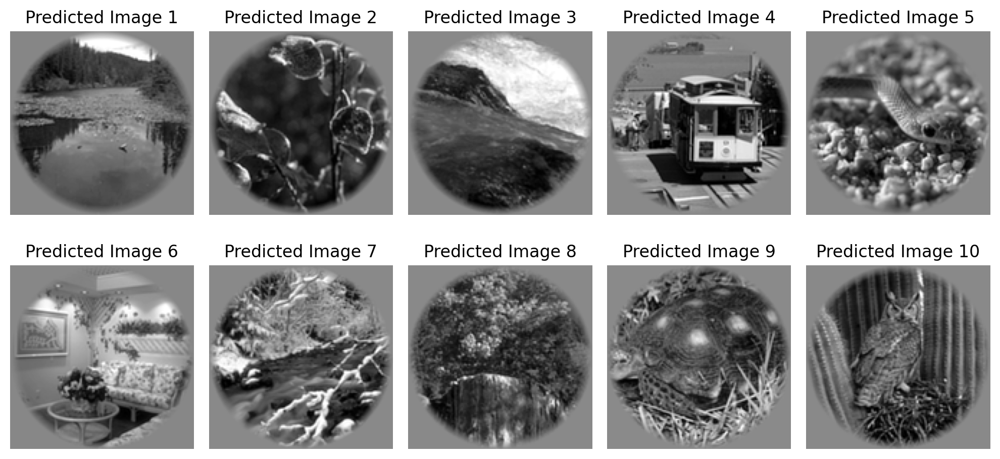

In [33]:
plt.figure(figsize=(10, 5))
for i in range(10):
    sample_response = X_test[i]
    predicted_image = predict_image(sample_response, classifier, stimuli, kmeans)
    
    # Check if predicted_image is not None before plotting
    if predicted_image is not None:
        plt.subplot(2, 5, i+1)  # 2 rows, 5 columns, ith plot
        plt.imshow(predicted_image, cmap='gray')
        plt.title("Predicted Image {}".format(i+1))
        plt.axis('off')  # Turn off axis for cleaner display
    else:
        # Handle the case when no image is found
        print(f"No image found for sample {i+1}")
plt.tight_layout()
plt.show()

# Conclusion & Discussion

Based on our results, the model does not correctly predict the image based on the neural response from the research participants. This was a very complicated problem having different responses to predict based on a image. Future research could aim to decompose the images based on orientation of each pixel and trying to understand how it is represented within the different parts of the brain and create a better sophisticated model to predict the images based on the neural response of the research participants.